In [1]:
import datetime as dt
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
def log_return(series):
    log_return = np.log(series / series.shift(1)).dropna()
    return log_return

In [3]:
def log_volume(series):
    log_return = np.log(series / series.shift(1)).dropna()
    return log_return

In [4]:
def bipower_variation(series, rollingWindow=5):
    '''
    Bipower Variation (BV) is the sum of the product of absolute time series returns
    :param column: price column
    :return: returns bivariate variation
    Barnhorf - Nielse & Shephard 2004 & 2006
    '''
    bv = (series.abs() *series.shift(1).abs()).dropna().rolling(rollingWindow).sum()
    
    return bv

In [5]:
def volatility_increments(series):
    theta = np.sqrt(series)
    Vt = (np.log(theta) - np.log(theta.shift(1))).dropna()
    return Vt

In [6]:
#################################################
# codes for implementing DFA-based analysis
# Exploring asymmetric multifractal cross-correlations of price-volatility and asymmetric volatility dynamics in cryptocurrency markets
#################################################
import numpy as np
import math
###########################################
# MF-ADCCA (includes DFA, DCCA, A-DFA, A-DCCA, MFDFA, MFDCCA, A-MFDFA)
##########################################

def dcca(x, y, S, m, Q, trend_base=None, skip_agg=False, asymmetry_base='index'):
    """
        Calculate generalized Hurst Exponenet by Multi Fractal Detrended Cross-correlation Analysis.
        Args:
            x(array(float))  : Target time series data.
            y(array(float))  : Target time series data.
            S(array(int))    : Intervals which divides culmative sum time series. Needs to a positive integer.
            m(int)           : Degree of polynomial fit for each divided segment. Generally, m=2 is recomendend
            Q(array(int))    : fluctuation q-th order.
            trend_base       : designated time series used for defining asymmetric trends.
            skip_agg(bool)   : Whether use cumsum for profile. If series is stationary (ex. log-returns), then "False". If non-stationary (ex. level data), then "True".
                               Its not needed.
            asymmetry_base  : Which criterion used for defining asymmetric trends.
        Returns:
            array(float)     : Return generalized hurst exponent (in np.array) of each Q-th order.
    """
    N = len(x)
    assert len(y) == N, '{} segments'.format(len(y))
    if skip_agg:
        X = np.copy(x)
        Y = np.copy(y)
    else:
        X = np.cumsum(x - np.mean(x))
        Y = np.cumsum(y - np.mean(y))

    def Fvs2(v, s, reverse=False):
        """
            (Root Mean Square) ** 2
            F(s, v)
        """
        Ns = int(N//s)
        ax = np.arange(1, s+1)
        if reverse:
            segment_x = X[N - (v-Ns)*s:N - (v-Ns)*s+s]
            segment_y = Y[N - (v-Ns)*s:N - (v-Ns)*s+s]
        else:
            segment_x = X[(v-1)*s:v*s]
            segment_y = Y[(v-1)*s:v*s]
        coef_x = np.polyfit(ax, segment_x, m)
        coef_y = np.polyfit(ax, segment_y, m)
        fitting_x = np.polyval(coef_x, ax)
        fitting_y = np.polyval(coef_y, ax)
        #return np.mean((segment_x - fitting_x)**2) # DFA for x
        #return np.mean((segment_y - fitting_y)**2) # DFA for y
        return np.mean(np.abs(segment_x - fitting_x)*np.abs(segment_y - fitting_y)) # DCCA for x and y

    if asymmetry_base == 'index':
        """
            Select which set of data series used for dividing its trends
        """
        x_alt = np.exp(np.cumsum(x)) # index-based
    elif asymmetry_base == 'return':
        x_alt = np.copy(x) # return-based
    elif asymmetry_base == 'optional':
        assert type(trend_base) == np.ndarray, 'trend_base is None. designate trend_base.'
        x_alt = np.copy(trend_base) # only for optional. Any series is possible, but desginate trend_base.
    else:
        print('not available: index or return or optional only\nPlease choose either and try again')

    def asym_trend(v, s, reverse=False):
        """
            Detecting trend in some data series H
            L_H(x)=a_H+b_H x
        """
        Ns = int(N//s)
        ax = np.arange(1, s+1)
        if reverse:
            segment = x_alt[N - (v-Ns)*s:N - (v-Ns)*s+s]
        else:
            segment = x_alt[(v-1)*s:v*s]
        coef = np.polyfit(ax, segment, 1) # m=1, y=ax+b (a,b)
        return coef[0] # represents a in y=ax+b

    Fhq = np.zeros(len(Q))
    Fhq_plus = np.zeros(len(Q))
    Fhq_minus = np.zeros(len(Q))
    
    for i, q in enumerate(Q):
        Fqs = np.zeros(len(S))
        Fqs_plus = np.zeros(len(S))
        Fqs_minus = np.zeros(len(S))

        for j, s in enumerate(S):
            Ns = int(N//s)
            segs = np.array([
                [Fvs2(v, s) for v in range(1, Ns + 1)],
                [Fvs2(v, s, reverse=True) for v in range(Ns+1, 2 * Ns + 1)]
            ]).reshape(-1)

            assert len(segs) == 2 * Ns, '{} segments'.format(len(segs))

            trend_segs = np.array([
                [asym_trend(v, s) for v in range(1, Ns + 1)],
                [asym_trend(v, s, reverse=True) for v in range(Ns+1, 2 * Ns + 1)]
            ]).reshape(-1)

            assert len(trend_segs) == 2 * Ns, '{} segments'.format(len(trend_segs))

            M_plus = np.sum((1+np.sign(trend_segs))/2)
            M_minus = np.sum((1-np.sign(trend_segs))/2)

            # calculate qth fluctuation function
            if q == 0:
                # asymmetric version
                Fqs_plus[j] = np.exp((np.sum(((1+np.sign(trend_segs))/2)*np.log(segs))/M_plus)/2)
                Fqs_minus[j] = np.exp((np.sum(((1-np.sign(trend_segs))/2)*np.log(segs))/M_minus)/2)
                # overall
                Fqs[j] = np.exp(np.mean(np.log(segs))/2)
            else:
                # asymmetric version
                Fqs_plus[j] = (np.sum(((1+np.sign(trend_segs))/2)*(segs ** (q/2))) /M_plus)**(1/q)
                Fqs_minus[j] = (np.sum(((1-np.sign(trend_segs))/2)*(segs ** (q/2)))/M_minus)**(1/q)
                # overall version
                Fqs[j] = np.mean(segs ** (q/2)) ** (1/q)
        
        coef_plus = np.polyfit(np.log(S), np.log(Fqs_plus), 1)
        coef_minus = np.polyfit(np.log(S), np.log(Fqs_minus), 1)
        coef = np.polyfit(np.log(S), np.log(Fqs), 1)
        Fhq_plus[i] = coef_plus[0]
        Fhq_minus[i] = coef_minus[0]
        Fhq[i] = coef[0]

    # 1~2: estimates for overall trend, 4~5: estimates for positive trend, 7~8: estimates for negative trend
    # S: scales, Fqs: fluctuation functions, Fhq: generalized hurst exponent
    return S, Fqs, Fhq, S, Fqs_plus, Fhq_plus, S, Fqs_minus, Fhq_minus

def basic_dcca(x, y, Q, m=2, trend_base=None, skip_agg=False, observations=100, asymmetry_base='index'):
    """
        polynominal fitting is set to m = 2 at defalt
    """
    N = len(x)
    s_min = max(20, int(np.floor(N/100)))
    s_max = min(20*s_min, int(np.floor(N/10)))
    s_inc = (s_max - s_min) / (observations-1)
    S = [s_min + int(np.floor(i*s_inc)) for i in range(0, observations)]
    return dcca(x, y, S=S, m=m, Q=Q, trend_base=trend_base, skip_agg=skip_agg, asymmetry_base=asymmetry_base)

In [7]:
def MFADCCA_Hurst(X, Y, T=252, step=1, Q=np.array([2]), trend_base=None, skip_agg=False, observations=100, asymmetry_base='return'):
    X = np.array(X)
    nX = X.shape[0]
    hurst = np.zeros(nX-T+1)
    hurst_plus = np.zeros(nX-T+1)
    hurst_minus = np.zeros(nX-T+1)
    for i in range(0, nX-T+1, step):
        XX = X[i:i+T]
        YY = Y[i:i+T]
        MFADCCA_Hurst = basic_dcca(XX, YY, Q=Q, trend_base=trend_base, skip_agg=skip_agg, observations=observations, asymmetry_base=asymmetry_base)
        hurst[i] = MFADCCA_Hurst[2]
        hurst_plus[i] = MFADCCA_Hurst[5]
        hurst_minus[i] = MFADCCA_Hurst[8]
    #return hurst
    return hurst, hurst_plus,hurst_minus

In [8]:
# read data_set and split them
dataset = pd.read_csv(r"./Datasets/FTSE/FTSE_QPL.csv")
df = dataset.reset_index(drop=True)
df = df.head(2515)

Close = df['Close']
Volume = df['vol']
# compute Log return and bipower variation for MFADCCA
LogReturn = log_return(Close)         # X
Bv = bipower_variation(LogReturn)     # Y
Vt = volatility_increments(Bv)
vol =  log_volume(Volume) 

Q = np.array([2])

df['log_returns'] = LogReturn         # add to df
df['volatility_increments'] = Vt
df['log_volumes'] = vol

In [9]:
data = df.dropna(axis=0, how='any')

r = data["log_returns"]
v = data["volatility_increments"]
vol = data['log_volumes']

data

,Unnamed: 0,Date,Open,High,Low,Close,QPLp1,QPLp2,QPLp3,QPLp4,...,QPLn16,QPLn17,QPLn18,QPLn19,QPLn20,QPLn21,vol,log_returns,volatility_increments,log_volumes
7,7.0,2012/1/12,5670.82,5699.57,5640.30,5662.42,5681.080334,5705.073501,5734.743030,5768.010344,...,5084.635031,5040.438773,4996.166045,4951.871863,4907.605538,4863.411329,1380.00,-0.001482,-0.071114,0.434793
8,8.0,2012/1/13,5662.42,5709.22,5583.45,5636.64,5672.665135,5696.622763,5726.248343,5759.466379,...,5077.103328,5032.972536,4988.765388,4944.536818,4900.336063,4856.207317,1320.00,-0.004563,-0.063487,-0.044452
9,9.0,2012/1/16,5636.64,5662.88,5609.87,5657.44,5646.838491,5670.687043,5700.177744,5733.244544,...,5053.988171,5010.058299,4966.052419,4922.025213,4878.025697,4834.097862,672.82,0.003683,-0.032243,-0.673909
10,10.0,2012/1/17,5657.44,5724.41,5657.44,5693.95,5667.676125,5691.612682,5721.212207,5754.401028,...,5072.638104,5028.546124,4984.377855,4940.188184,4896.026302,4851.936368,1230.00,0.006433,-0.240954,0.603292
11,11.0,2012/1/18,5693.95,5709.87,5647.92,5702.37,5704.252183,5728.343214,5758.133758,5791.536762,...,5105.374114,5060.997590,5016.544283,4972.069436,4927.622558,4883.248091,792.32,0.001478,-0.326377,-0.439804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1509,1509.0,2017/12/19,7537.01,7563.49,7534.08,7544.09,7550.646870,7582.535864,7621.969233,7666.184369,...,6757.919503,6699.178855,6640.336573,6581.465776,6522.632003,6463.894080,695.72,0.000939,-0.211883,0.172379
1510,1510.0,2017/12/20,7544.09,7550.60,7511.45,7525.22,7557.739680,7589.658630,7629.129041,7673.385711,...,6764.267653,6705.471827,6646.574269,6587.648172,6528.759133,6469.966032,679.71,-0.002504,-0.005441,-0.023281
1511,1511.0,2017/12/21,7525.22,7609.69,7517.88,7603.98,7538.835539,7570.674649,7610.046333,7654.192304,...,6747.348219,6688.699459,6629.949222,6571.170516,6512.428775,6453.782734,640.56,0.010412,0.120333,-0.059323
1512,1512.0,2017/12/22,7603.98,7614.40,7585.47,7592.66,7617.738041,7649.910384,7689.694137,7734.302146,...,6817.966905,6758.704318,6699.339193,6639.945301,6580.588761,6521.328923,251.37,-0.001490,-0.111929,-0.935417


In [10]:
hurst, hurst_plus, hurst_minus = MFADCCA_Hurst(r, vol, T=256, step=1, Q=Q, trend_base=None, skip_agg=False, observations=100, asymmetry_base='return')

In [11]:
hurst.shape

(1252,)

In [12]:
data['hurst'] = pd.DataFrame(np.array([0] * 1252))
data['hurstp'] = pd.DataFrame(np.array([0] * 1252))
data['hurstm'] = pd.DataFrame(np.array([0] * 1252))

data = data.tail(1252)

data['hurst'] = hurst
data['hurstp'] = hurst_plus
data['hurstm'] = hurst_minus
data = data.reset_index(drop = True)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_4692\1359868609.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['hurst'] = pd.DataFrame(np.array([0] * 1252))
C:\Users\Administrator\AppData\Local\Temp\ipykernel_4692\1359868609.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['hurstp'] = pd.DataFrame(np.array([0] * 1252))
C:\Users\Administrator\AppData\Local\Temp\ipykernel_4692\1359868609.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [13]:
data.to_csv(r'./Datasets/FTSE/FTSE_MFADCCA.csv')

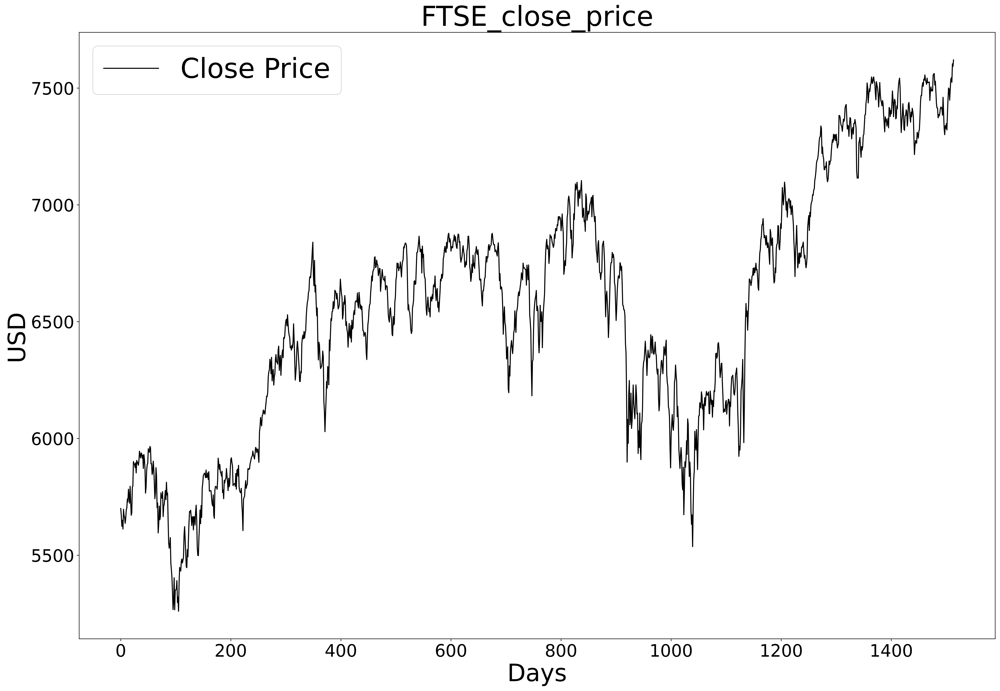

In [14]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(Close,color='k')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('USD', fontsize=35)
plt.title('FTSE_close_price', fontsize=40)
plt.legend(['Close Price'],fontsize=40)
plt.savefig('./pic/FTSE_pic/FTSE_close.png')
plt.show()

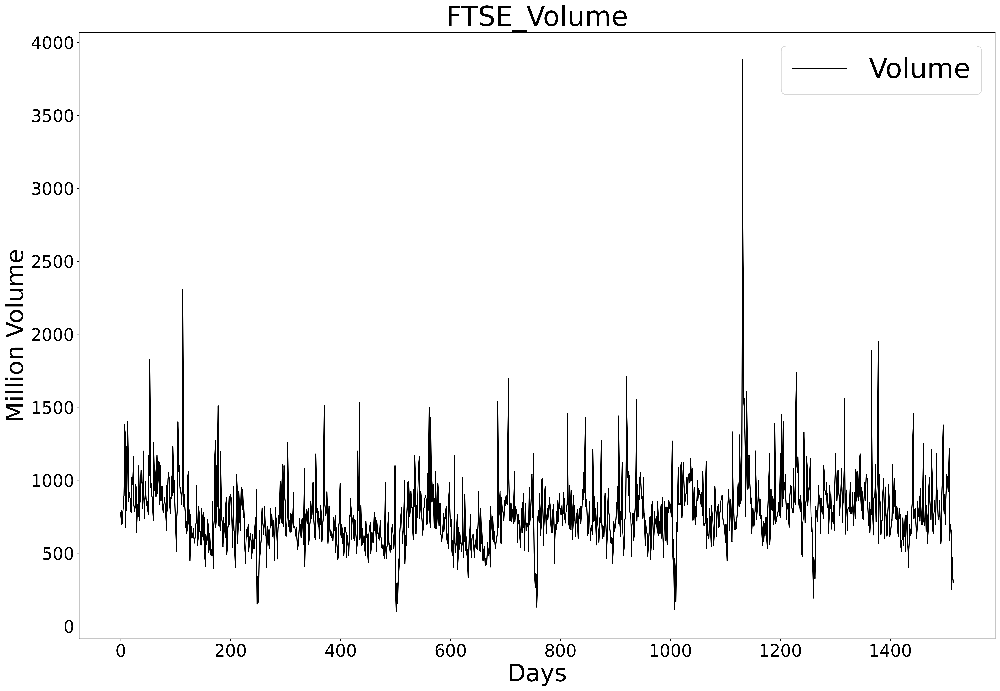

In [15]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(Volume,color='k')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('Million Volume', fontsize=35)
plt.title('FTSE_Volume', fontsize=40)
plt.legend(['Volume'],fontsize=40)
plt.savefig('./pic/FTSE_pic/FTSE_volume.png')
plt.show()

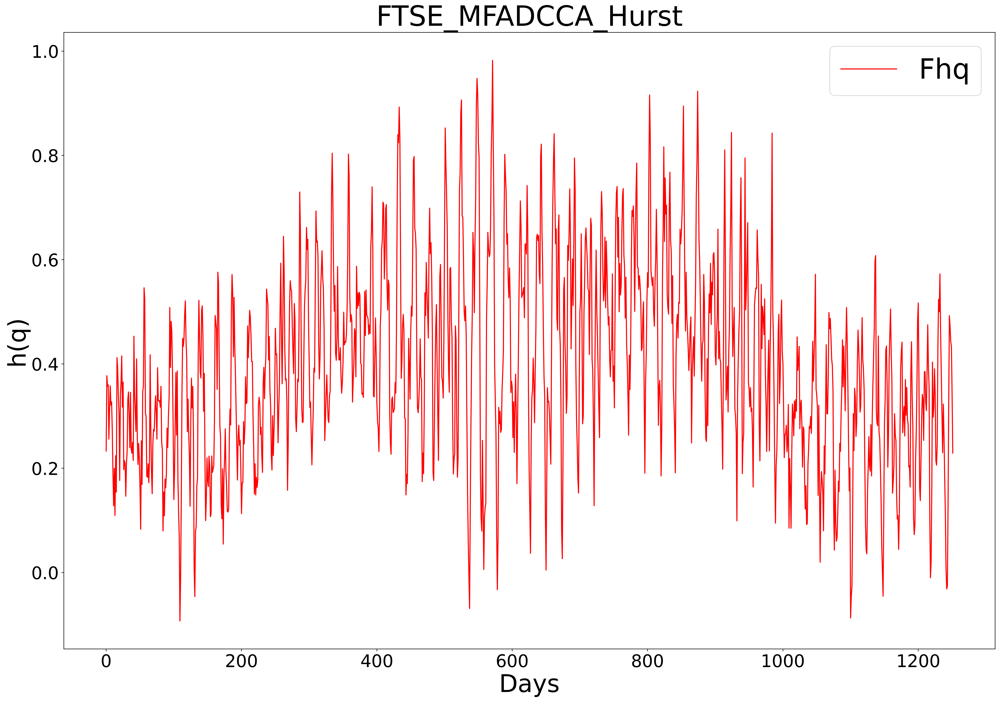

In [16]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(hurst,color='r')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('h(q)', fontsize=35)
plt.title('FTSE_MFADCCA_Hurst', fontsize=40)
plt.legend(['Fhq'],fontsize=40)
plt.savefig('./pic/FTSE_pic/FTSE_MFADCCA_hurst.png')
plt.show()

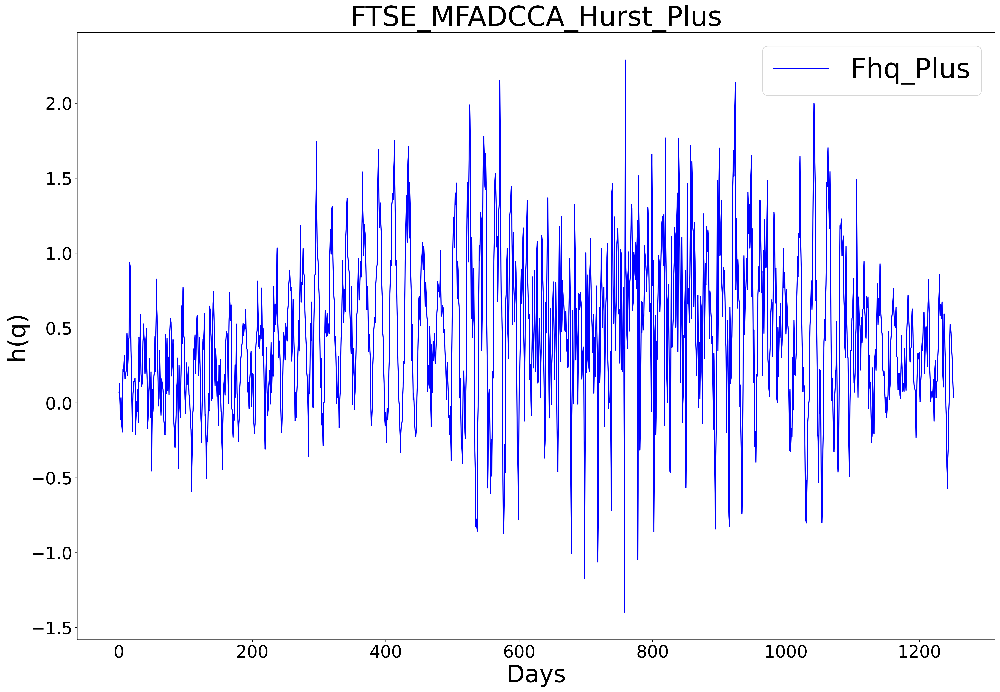

In [17]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(hurst_plus,color='b')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('h(q)', fontsize=35)
plt.title('FTSE_MFADCCA_Hurst_Plus', fontsize=40)
plt.legend(['Fhq_Plus'],fontsize=40)
plt.savefig('./pic/FTSE_pic/FTSE_MFADCCA_hurstplus.png')
plt.show()

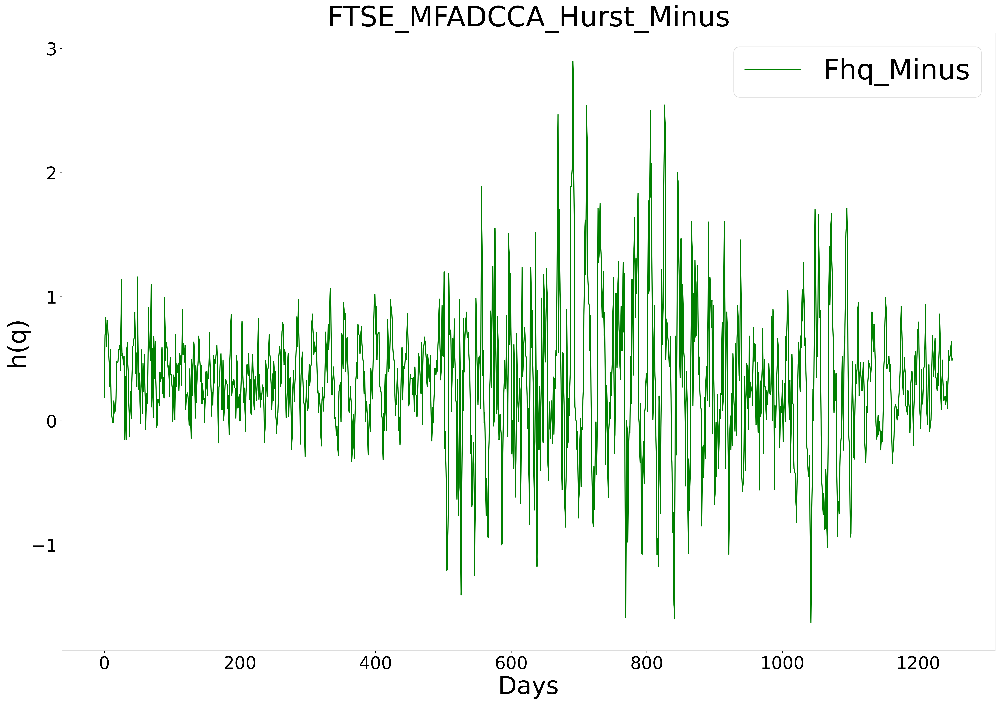

In [18]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(hurst_minus,color='g')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('h(q)', fontsize=35)
plt.title('FTSE_MFADCCA_Hurst_Minus', fontsize=40)
plt.legend(['Fhq_Minus'],fontsize=40)
plt.savefig('./pic/FTSE_pic/FTSE_MFADCCA_hurstminus.png')
plt.show()

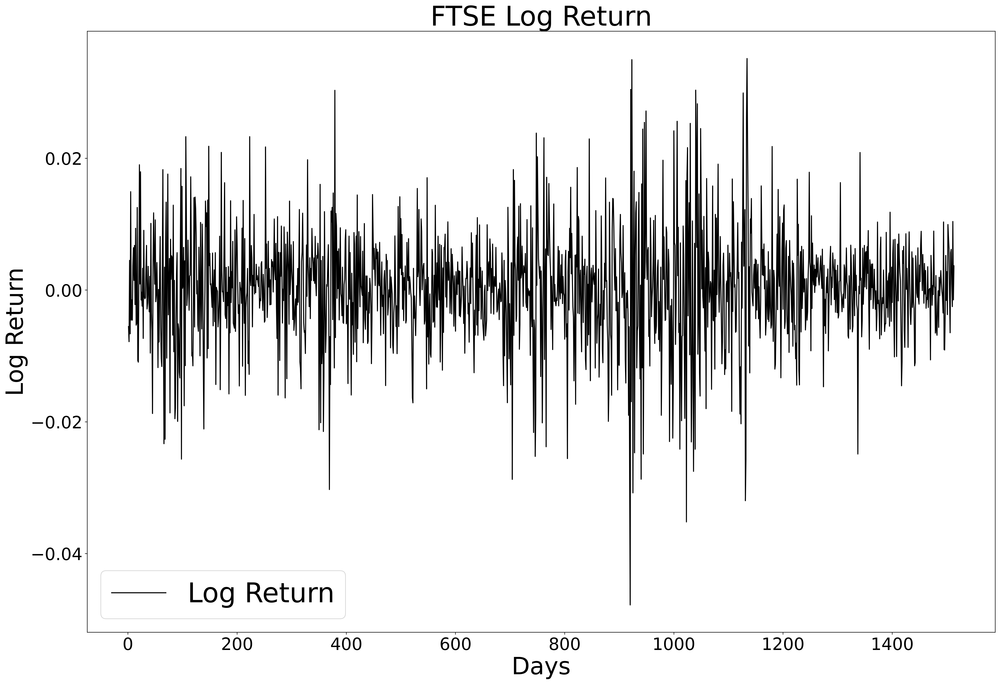

In [19]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(LogReturn,color='k')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('Log Return', fontsize=35)
plt.title('FTSE Log Return', fontsize=40)
plt.legend(['Log Return'],fontsize=40)
plt.savefig('./pic/FTSE_pic/FTSE_logreturn.png')
plt.show()